# Predict the survival months for the breast cancer patients predicted to die

## 1. Import libraries

In [ ]:
# --------------------------------------------------
import pandas as pd
from sklearn.model_selection import train_test_split
from matplotlib import pyplot as plt

# Import models -------------------------------------
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeRegressor

# Import metrics ------------------------------------
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import classification_report
from sklearn.metrics import RocCurveDisplay
from sklearn import metrics
from sklearn import tree
from sklearn.model_selection import GridSearchCV

# Import imblearn -----------------------------------
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline
from collections import Counter
from sklearn.ensemble import VotingClassifier

## 2. Read dataset from CSV

In [ ]:
# data = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Coursework/CleanCourseworkData.csv')
data = pd.read_csv('CleanCourseworkData.csv')
data.head()

,Age,T_Stage,N_Stage,6th_Stage,Differentiated,Grade,A_Stage,Tumor_Size,Estrogen_Status,Progesterone_Status,Regional_Node_Examined,Reginol_Node_Positive,Survival_Months,Mortality_Status
0,68,0,0,0,1,3,0,4,0,0,24,1,60,0
1,50,1,1,2,0,2,0,35,0,0,14,5,62,0
2,58,2,2,4,0,2,0,63,0,0,14,7,75,0
3,58,0,0,0,1,3,0,18,0,0,2,1,84,0
4,47,1,0,1,1,3,0,41,0,0,3,1,50,0


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4007 entries, 0 to 4006
Data columns (total 14 columns):
 #   Column                  Non-Null Count  Dtype
---  ------                  --------------  -----
 0   Age                     4007 non-null   int64
 1   T_Stage                 4007 non-null   int64
 2   N_Stage                 4007 non-null   int64
 3   6th_Stage               4007 non-null   int64
 4   Differentiated          4007 non-null   int64
 5   Grade                   4007 non-null   int64
 6   A_Stage                 4007 non-null   int64
 7   Tumor_Size              4007 non-null   int64
 8   Estrogen_Status         4007 non-null   int64
 9   Progesterone_Status     4007 non-null   int64
 10  Regional_Node_Examined  4007 non-null   int64
 11  Reginol_Node_Positive   4007 non-null   int64
 12  Survival_Months         4007 non-null   int64
 13  Mortality_Status        4007 non-null   int64
dtypes: int64(14)
memory usage: 438.4 KB


## 3. Extracting feature coloumns for the prediction

In [ ]:
feature_cols = ['Age', 'T_Stage', 'N_Stage', '6th_Stage', 'Differentiated', 'Grade', 'A_Stage', 'Tumor_Size', 'Estrogen_Status', 'Progesterone_Status', 'Regional_Node_Examined', 'Reginol_Node_Positive']

# Features
X = data[feature_cols]
y = data['Mortality_Status']

## 4. Balancing the data for an accurate prediction

The SMOTE algorithm randomly selects a minority class instance A and finds its K nearest minority class neighbors. Then it creates a synthetic instance B by ramdomly choosing one of the K nearest neighbors and connects A to B.  
All synthetic instances are generated as a combination of the 2 selacted instances A and B.  
*More details in **"Imbalanced Learning: Foundations, Algorithms and Applications, 2013"** or [SMOTE Imbalance Classification with Python](https://machinelearningmastery.com/smote-oversampling-for-imbalanced-classification/).*

In [ ]:
# numbers before SMOTE
num_before = dict(Counter(y))

# now, lets do SMOTE
over = SMOTE(sampling_strategy = 0.9)   #consider 90% from the data
under = RandomUnderSampler(sampling_strategy = 0.9)
pipeline_steps = [('o', over), ('u', under)]
pipeline = Pipeline(steps = pipeline_steps)

# transform the dataset
X_smote, y_smote = pipeline.fit_resample(X, y)

# numbers after SMOTE
num_after = dict(Counter(y_smote))

print(num_before, num_after)
X = X_smote
y = y_smote

{0: 3393, 1: 614} {0: 3392, 1: 3053}


## 5. Train-Test split

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2, random_state=42, stratify=y)

## 6. Building an ensemble learner

An ensemble learner combines multiple individual models (in this case Logistic Regression and K-Nearest Neighbours) to improve overall performance. It usually leads to more accurate and robust results than a single model.

In [ ]:
# Individual models
logreg = LogisticRegression(max_iter=10000)
knn = KNeighborsClassifier(n_neighbors = 3)

# Creating the voting classifier
base_learners=[('LR', logreg), ('KNN', knn)]
ensemble_learner = VotingClassifier(base_learners, voting='soft')

In [ ]:
ensemble_learner = ensemble_learner.fit(X_train, y_train)
y_pred_ensemble_learner = ensemble_learner.predict(X_test)

Display the accuracy of the voting ensemble classifier

In [ ]:
ensemble_learner_accuracy = accuracy_score(y_test, y_pred_ensemble_learner)
print ("The voting ensemble classifier accuracy is: ", ensemble_learner_accuracy)

The voting ensemble classifier accuracy is:  0.7843289371605896


Confusion matrix

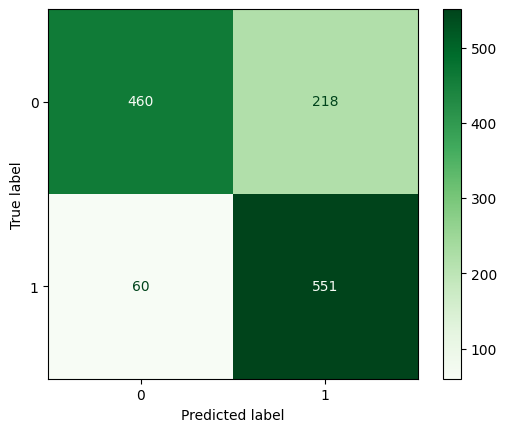

In [ ]:
ensemble_learner_cm_test = confusion_matrix(y_test, y_pred_ensemble_learner, labels=ensemble_learner.classes_)

ensemble_learner_disp = ConfusionMatrixDisplay(ensemble_learner_cm_test,display_labels=ensemble_learner.classes_)
ensemble_learner_disp.plot(cmap='Greens')

Classification report

In [ ]:
print("Ensemble Learner Classification Report \n", classification_report(y_test, y_pred_ensemble_learner,  zero_division = 1))

Ensemble Learner Classification Report 
               precision    recall  f1-score   support

           0       0.88      0.68      0.77       678
           1       0.72      0.90      0.80       611

    accuracy                           0.78      1289
   macro avg       0.80      0.79      0.78      1289
weighted avg       0.80      0.78      0.78      1289



ROC curve estimator

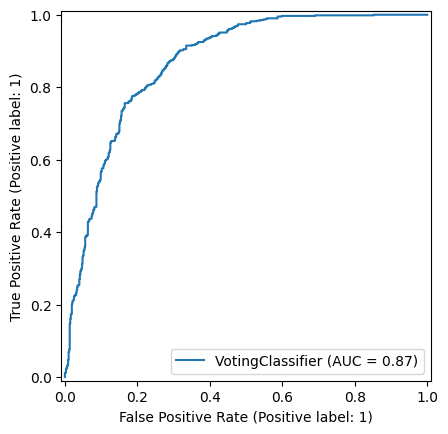

In [ ]:
ensemble_learner = RocCurveDisplay.from_estimator(ensemble_learner, X_test, y_test)

# Predict the survival months for the breast cancer patients predicted to die

## 1. Read dataset from CSV

In [ ]:
# dataset = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Coursework/CleanCourseworkDataForSurvival.csv')
dataset = pd.read_csv('CleanCourseworkDataForSurvival.csv')
dataset.head()

,Age,T_Stage,N_Stage,6th_Stage,Differentiated,Grade,A_Stage,Tumor_Size,Estrogen_Status,Progesterone_Status,Regional_Node_Examined,Reginol_Node_Positive,Survival_Months,Mortality_Status
0,40,1,0,1,0,2,0,30,0,0,9,1,14,1
1,68,0,0,0,0,2,0,13,0,0,9,1,64,1
2,57,2,2,4,0,2,0,70,0,0,12,12,42,1
3,42,0,2,4,0,2,0,9,1,1,15,2,39,1
4,67,0,0,0,0,2,0,13,0,0,16,3,60,1


In [ ]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 614 entries, 0 to 613
Data columns (total 14 columns):
 #   Column                  Non-Null Count  Dtype
---  ------                  --------------  -----
 0   Age                     614 non-null    int64
 1   T_Stage                 614 non-null    int64
 2   N_Stage                 614 non-null    int64
 3   6th_Stage               614 non-null    int64
 4   Differentiated          614 non-null    int64
 5   Grade                   614 non-null    int64
 6   A_Stage                 614 non-null    int64
 7   Tumor_Size              614 non-null    int64
 8   Estrogen_Status         614 non-null    int64
 9   Progesterone_Status     614 non-null    int64
 10  Regional_Node_Examined  614 non-null    int64
 11  Reginol_Node_Positive   614 non-null    int64
 12  Survival_Months         614 non-null    int64
 13  Mortality_Status        614 non-null    int64
dtypes: int64(14)
memory usage: 67.3 KB


## 2. Extracting feature coloumns for the prediction

In [ ]:
dataset = dataset.drop("Mortality_Status", axis = 1)
feature_cols = ['Age', 'T_Stage', 'N_Stage', '6th_Stage', 'Differentiated', 'Grade', 'A_Stage', 'Tumor_Size', 'Estrogen_Status', 'Progesterone_Status', 'Regional_Node_Examined', 'Reginol_Node_Positive']

# Features
X = dataset[feature_cols]
y = dataset['Survival_Months']

['Age',
 'T_Stage',
 'N_Stage',
 '6th_Stage',
 'Differentiated',
 'Grade',
 'A_Stage',
 'Tumor_Size',
 'Estrogen_Status',
 'Progesterone_Status',
 'Regional_Node_Examined',
 'Reginol_Node_Positive']

## 3. Train-Test split



In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=2)

## 4. Model

### 4.1. Decision Tree

A decision tree is a model used for classification and regression. It splits data into branches based on feature values, making decisions at each node, and ultimately assigns a prediction at the leaves.

In [ ]:
DT_regressor = DecisionTreeRegressor()
DT_regressor.fit(X_train, y_train)

DecisionTreeRegressor()

Code used from code reuse session in week 9, block 1.8.

In [ ]:
y_pred = DT_regressor.predict(X_test)

Mean Absolute Error, Mean Square Error and R-squared metrics for the decision tree

In [ ]:
print('MAE:', metrics.mean_absolute_error(y_test, y_pred))
print('MSE:', metrics.mean_squared_error(y_test, y_pred))
print('R2:', metrics.r2_score(y_test, y_pred))

MAE: 26.96747967479675
MSE: 1095.5365853658536
R2: -0.8780269671079601


#### 4.1.1. Display the decision tree

In [ ]:
Tree_figure = plt.figure(figsize=(200,200))
DT_Graph = tree.plot_tree(DT_regressor, feature_names=list(X_train.columns), filled=True)

#### 4.1.2. Save the decision tree

In [ ]:
Tree_figure.savefig("decistion_tree.png")

#### 4.2.1. Prune the decision tree to 4 levels


In [ ]:
DT_regressor = DecisionTreeRegressor(max_depth=4)
DT_regressor.fit(X_train, y_train)
y_pred = DT_regressor.predict(X_test)

#### 4.2.2. Display the pruned (to 4 levels) decision tree

In [ ]:
Tree_figure = plt.figure(figsize=(200,200))
DT_Graph = tree.plot_tree(DT_regressor, feature_names=list(X_train.columns), filled=True)

#### 4.2.3. Save the pruned (to 4 levels) decision tree

In [ ]:
Tree_figure.savefig("decistion_tree_pruned.png")

Mean Absolute Error, Mean Square Error and R-squared metrics for the pruned decision tree

In [ ]:
print('MAE:', metrics.mean_absolute_error(y_test, y_pred))
print('MSE:', metrics.mean_squared_error(y_test, y_pred))
print('R2:', metrics.r2_score(y_test, y_pred))

MAE: 19.676872688924337
MSE: 575.5665779468164
R2: 0.013333220278361368
